### Run Incidents Model

- Here we present a demo of running inference with our model, from a checkpoint.
- To train a model for yourself, please see the `README.md` with instructions for using `run_model.py`.

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
!python3 -m pip install configargparse

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import os
import pprint
import glob
import json
from tqdm import tqdm
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
%matplotlib inline

from architectures import (
    FilenameDataset,
    get_incidents_model,
    update_incidents_model_with_checkpoint,
    update_incidents_model_to_eval_mode,
    get_predictions_from_model
)
from parserr import get_parser, get_postprocessed_args

In [ ]:
# data
image_filenames = sorted(glob.glob("../CRISISMMD_IMAGES/*"))

# model
CONFIG_FILENAME = "configs/eccv_final_model"
CHECKPOINT_PATH_FOLDER = "pretrained_weights/"

In [ ]:
# you can replace the filenames with your own
image_filenames

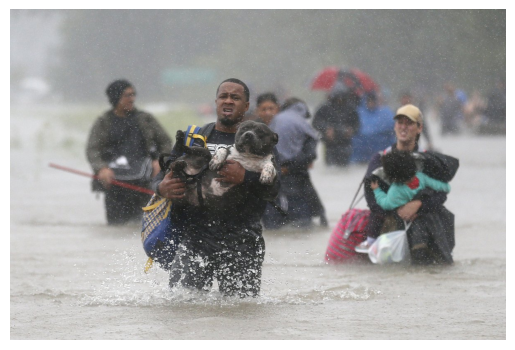

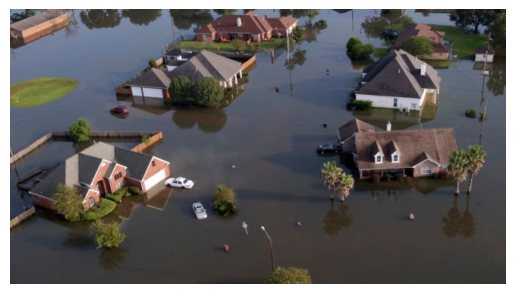

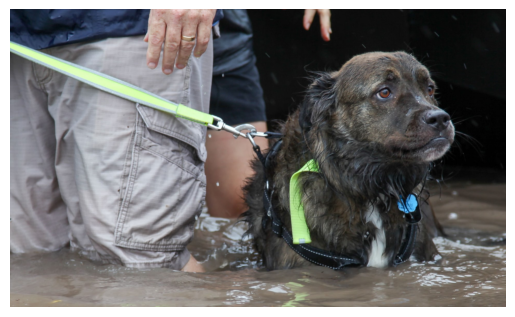

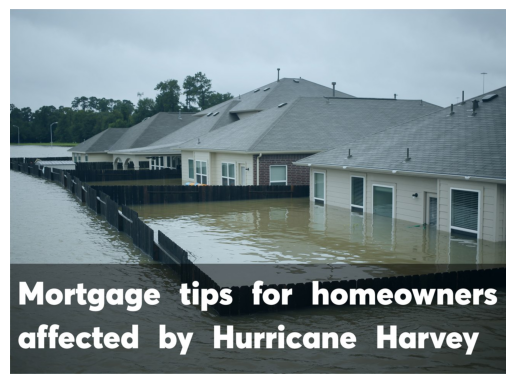

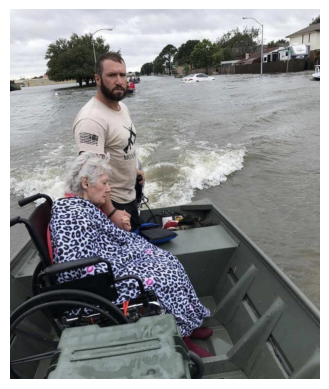

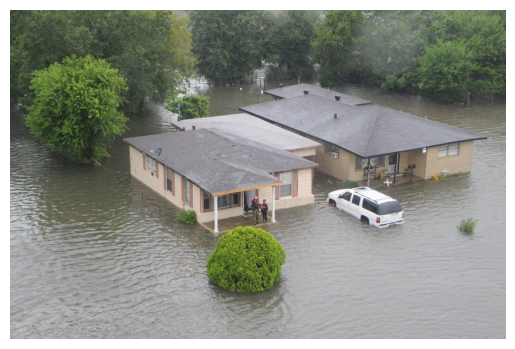

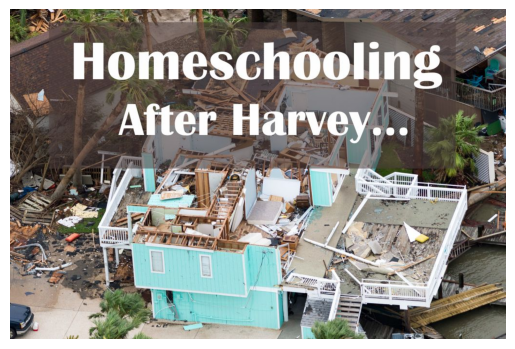

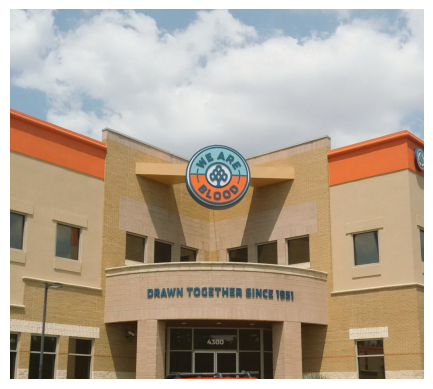

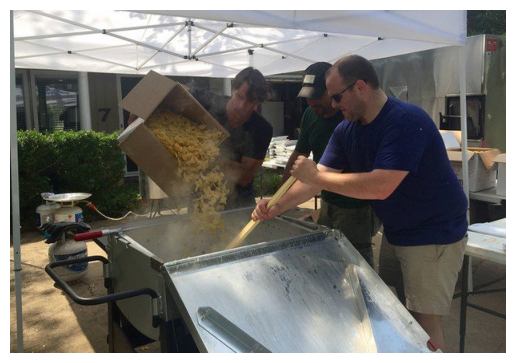

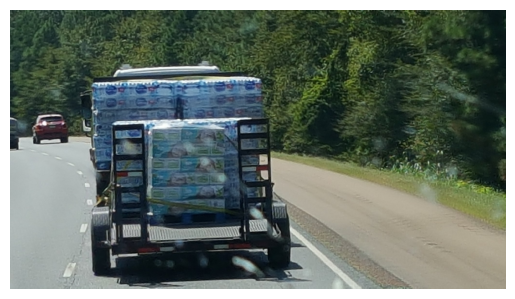

In [ ]:
for image_filename in image_filenames[1000:1010]:
    img = cv2.imread(image_filename)[:,:,::-1].copy() 
    plt.axis('off')
    plt.imshow(img)
    plt.show()

In [ ]:
# Load model from checkpoint.
parser = get_parser()
args = parser.parse_args(args="--config={} --checkpoint_path={} --mode=test --num_gpus=1".format(CONFIG_FILENAME, CHECKPOINT_PATH_FOLDER))
args = get_postprocessed_args(args)

incidents_model = get_incidents_model(args)
update_incidents_model_with_checkpoint(incidents_model, args)
update_incidents_model_to_eval_mode(incidents_model)

loading places weights for pretraining
Let's use 1 GPUs!
eccv_final_model
Loaded checkpoint 'pretrained_weights/eccv_final_model_trunk.pth.tar' (epoch 15).
Loaded checkpoint 'pretrained_weights/eccv_final_model_place.pth.tar' (epoch 15).
Loaded checkpoint 'pretrained_weights/eccv_final_model_incident.pth.tar' (epoch 15).
Switching to eval mode.


In [ ]:
from incidents_utils import get_index_to_incident_mapping, get_index_to_place_mapping

In [ ]:
# Set up the data loader for quickly loading images to run inference with.
print("num images: {}".format(len(image_filenames[300:350])))
targets = [image_filenames[i] for i in range(300,350)]
dataset = FilenameDataset(image_filenames, targets)
loader = torch.utils.data.DataLoader(
    dataset,
    batch_size=32,
    shuffle=False,
    num_workers=4
)

inference_dict = {}
for idx, (batch_input, image_paths) in enumerate(tqdm(loader)):
    # run the model, get the output, set the inference_dict
    output = get_predictions_from_model(
        args,
        incidents_model,
        batch_input,
        image_paths,
        get_index_to_incident_mapping(),
        get_index_to_place_mapping(),
        inference_dict,
        topk=5
    )

num images: 50


AssertionError: ignored

In [ ]:
print(len(inference_dict))

3357


In [ ]:
class NumpyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        return json.JSONEncoder.default(self, obj)

In [ ]:
import json
with open('../CrisisMMD_v2.0/crisismmd_inference_dict.json', 'w') as fp:
    json.dump(inference_dict, fp, cls=NumpyEncoder)

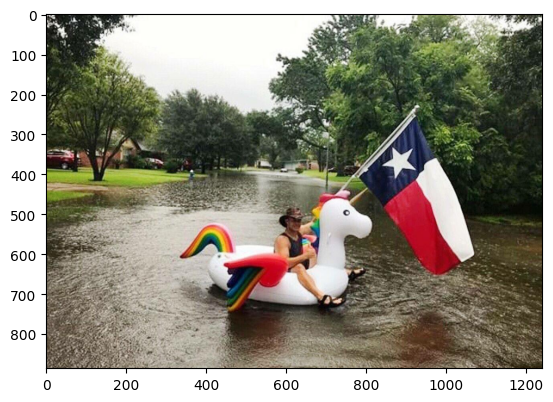

{'incident_probs': array([0.23879868, 0.01329881, 0.00528567, 0.00149768, 0.00149195],
      dtype=float32),
 'incidents': ['flooded',
               'airplane accident',
               'heavy rainfall',
               'blocked',
               'ship boat accident'],
 'place_probs': array([0.42498237, 0.4040043 , 0.24943447, 0.03978318, 0.01815354],
      dtype=float32),
 'places': ['park', 'river', 'lake natural', 'field', 'forest']}


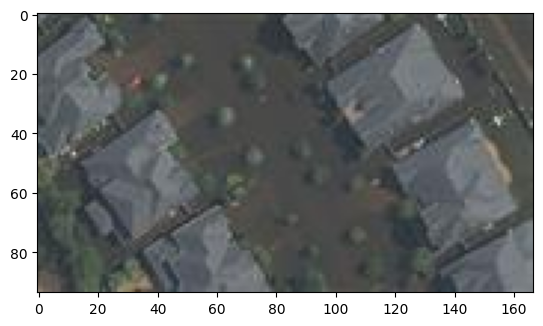

{'incident_probs': array([0.11304456, 0.10447121, 0.09724806, 0.05858106, 0.04377402],
      dtype=float32),
 'incidents': ['sinkhole',
               'collapsed',
               'airplane accident',
               'dirty contamined',
               'hailstorm'],
 'place_probs': array([0.30535552, 0.09521963, 0.04671556, 0.04367409, 0.03354212],
      dtype=float32),
 'places': ['landfill', 'building outdoor', 'house', 'dam', 'forest']}


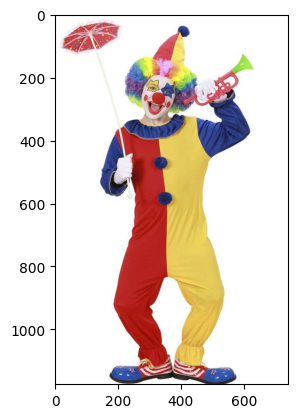

{'incident_probs': array([0.0150104 , 0.01476209, 0.0132556 , 0.01179074, 0.01172827],
      dtype=float32),
 'incidents': ['on fire', 'fire whirl', 'burned', 'ice storm', 'with smoke'],
 'place_probs': array([0.04058391, 0.01934941, 0.01222042, 0.0118717 , 0.008797  ],
      dtype=float32),
 'places': ['fire station',
            'building outdoor',
            'sports field',
            'railroad track',
            'street']}


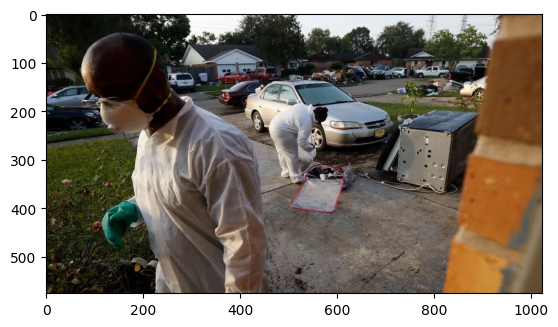

{'incident_probs': array([0.07433663, 0.05542238, 0.05008266, 0.02952174, 0.02741083],
      dtype=float32),
 'incidents': ['car accident',
               'bus accident',
               'dirty contamined',
               'damaged',
               'tropical cyclone'],
 'place_probs': array([0.13751674, 0.11518584, 0.07523621, 0.05820896, 0.03187118],
      dtype=float32),
 'places': ['parking lot', 'junkyard', 'park', 'building outdoor', 'farm']}


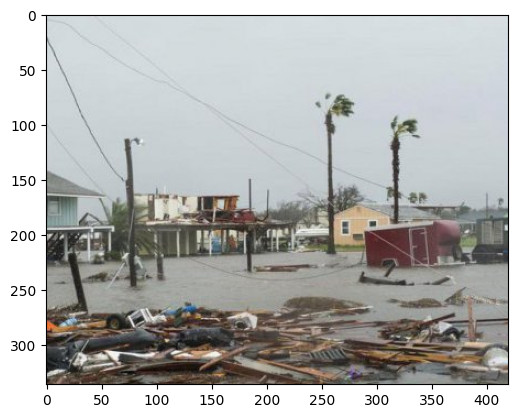

{'incident_probs': array([0.6404655 , 0.08131632, 0.01792702, 0.00250423, 0.00200013],
      dtype=float32),
 'incidents': ['tropical cyclone',
               'earthquake',
               'storm surge',
               'damaged',
               'dirty contamined'],
 'place_probs': array([0.22819403, 0.18395153, 0.17971382, 0.10776126, 0.05003523],
      dtype=float32),
 'places': ['building outdoor',
            'slum',
            'street',
            'power line',
            'residential neighborhood']}


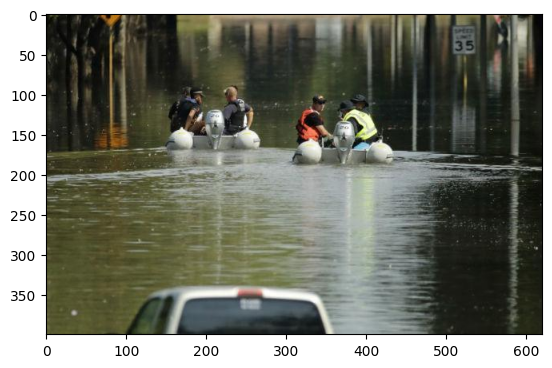

{'incident_probs': array([9.5799637e-01, 4.6443739e-03, 5.9946987e-04, 4.1934717e-04,
       2.5728985e-04], dtype=float32),
 'incidents': ['flooded',
               'heavy rainfall',
               'storm surge',
               'tropical cyclone',
               'mudslide mudflow'],
 'place_probs': array([0.17664094, 0.16441576, 0.10295895, 0.10281391, 0.03508593],
      dtype=float32),
 'places': ['street', 'building outdoor', 'river', 'highway', 'lake natural']}


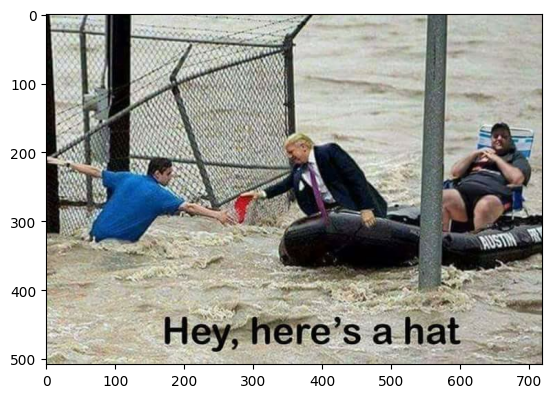

{'incident_probs': array([0.388587  , 0.08553638, 0.06942827, 0.0507553 , 0.04462697],
      dtype=float32),
 'incidents': ['flooded',
               'ship boat accident',
               'heavy rainfall',
               'mudslide mudflow',
               'storm surge'],
 'place_probs': array([0.41544595, 0.14014089, 0.10973475, 0.05872772, 0.04161312],
      dtype=float32),
 'places': ['beach', 'river', 'coast', 'sports field', 'pier']}


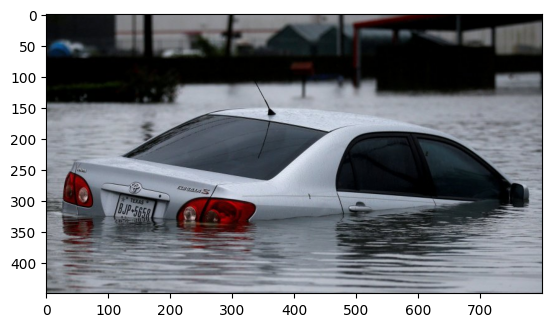

{'incident_probs': array([9.769646e-01, 3.258899e-03, 2.953347e-03, 1.410349e-03,
       3.994375e-04], dtype=float32),
 'incidents': ['flooded',
               'heavy rainfall',
               'storm surge',
               'tropical cyclone',
               'ship boat accident'],
 'place_probs': array([0.47403127, 0.15734093, 0.13522394, 0.04624924, 0.04547416],
      dtype=float32),
 'places': ['river',
            'parking lot',
            'building outdoor',
            'street',
            'lake natural']}


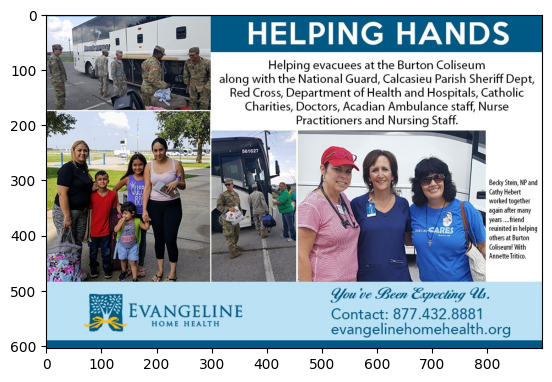

{'incident_probs': array([0.02106679, 0.01302298, 0.0101537 , 0.00954265, 0.00899358],
      dtype=float32),
 'incidents': ['tornado',
               'snowslide avalanche',
               'with smoke',
               'airplane accident',
               'car accident'],
 'place_probs': array([0.19271258, 0.03726268, 0.02052429, 0.01562514, 0.01538816],
      dtype=float32),
 'places': ['building outdoor', 'volcano', 'fire station', 'house', 'street']}


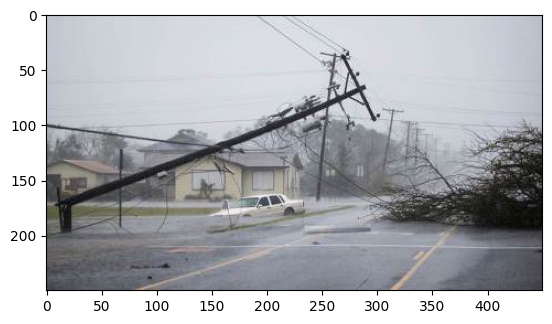

{'incident_probs': array([0.7496928 , 0.01996425, 0.01476497, 0.01326691, 0.01185095],
      dtype=float32),
 'incidents': ['tropical cyclone',
               'flooded',
               'heavy rainfall',
               'storm surge',
               'blocked'],
 'place_probs': array([0.7439477 , 0.06917766, 0.0468648 , 0.04042615, 0.00799944],
      dtype=float32),
 'places': ['power line',
            'street',
            'residential neighborhood',
            'building outdoor',
            'highway']}


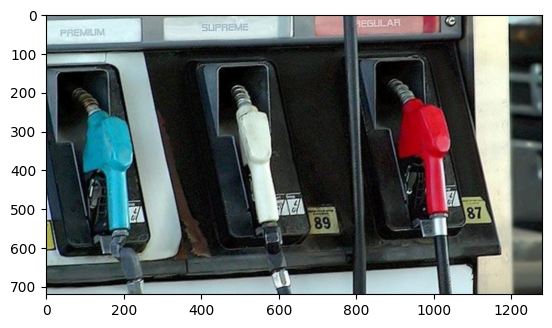

{'incident_probs': array([0.04944519, 0.04817983, 0.04701763, 0.02951208, 0.01996217],
      dtype=float32),
 'incidents': ['van accident',
               'bus accident',
               'car accident',
               'traffic jam',
               'mudslide mudflow'],
 'place_probs': array([0.33738258, 0.17060286, 0.05685537, 0.03998455, 0.01678092],
      dtype=float32),
 'places': ['gas station',
            'building outdoor',
            'street',
            'fire station',
            'highway']}


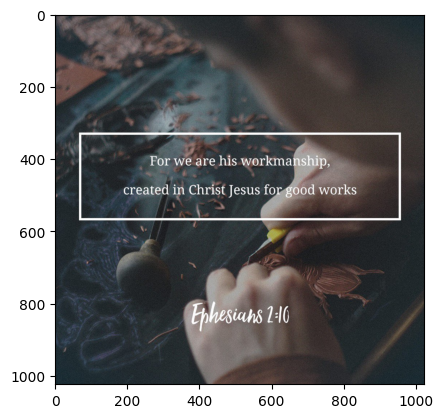

{'incident_probs': array([0.39567557, 0.03846408, 0.0197726 , 0.0160446 , 0.01404413],
      dtype=float32),
 'incidents': ['hailstorm',
               'with smoke',
               'dust sand storm',
               'storm surge',
               'tropical cyclone'],
 'place_probs': array([0.06298099, 0.0463286 , 0.02785571, 0.02281959, 0.0202589 ],
      dtype=float32),
 'places': ['volcano', 'sky', 'sports field', 'ocean', 'beach']}


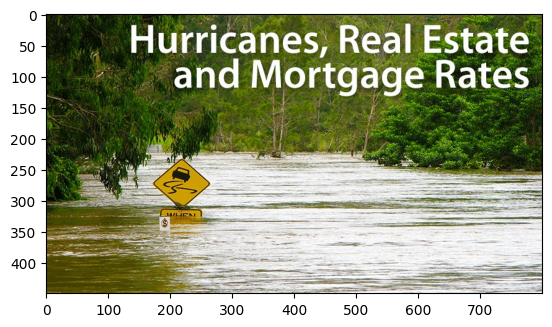

{'incident_probs': array([7.3271942e-01, 3.3413060e-03, 2.5575685e-03, 9.6031267e-04,
       6.1875943e-04], dtype=float32),
 'incidents': ['flooded',
               'tropical cyclone',
               'heavy rainfall',
               'mudslide mudflow',
               'storm surge'],
 'place_probs': array([0.34544933, 0.08366842, 0.05176599, 0.03356645, 0.03227964],
      dtype=float32),
 'places': ['river', 'forest', 'forest road', 'street', 'lake natural']}


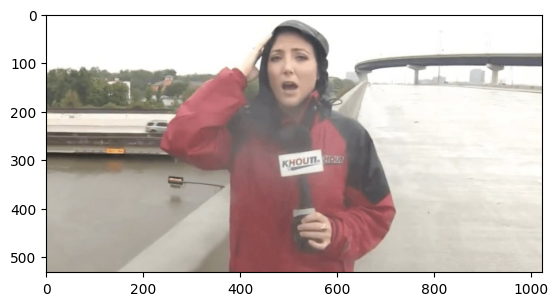

{'incident_probs': array([0.1337458 , 0.0883859 , 0.06554532, 0.0572182 , 0.02951707],
      dtype=float32),
 'incidents': ['flooded', 'hailstorm', 'heavy rainfall', 'fog', 'with smoke'],
 'place_probs': array([0.2726925 , 0.14786847, 0.06338575, 0.06065782, 0.01422085],
      dtype=float32),
 'places': ['highway', 'bridge', 'parking lot', 'building outdoor', 'street']}


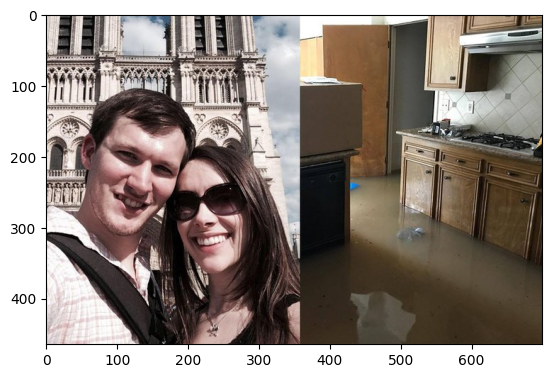

{'incident_probs': array([0.5686455 , 0.01561043, 0.00825282, 0.00639686, 0.00437686],
      dtype=float32),
 'incidents': ['flooded',
               'mudslide mudflow',
               'burned',
               'damaged',
               'under construction'],
 'place_probs': array([0.3316709 , 0.14301136, 0.02083305, 0.01412715, 0.00962287],
      dtype=float32),
 'places': ['building outdoor',
            'religious building',
            'building facade',
            'house',
            'street']}


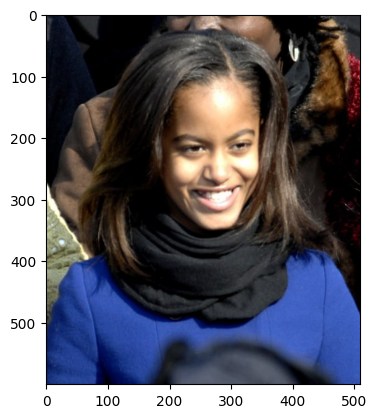

{'incident_probs': array([0.07294987, 0.03205116, 0.02737285, 0.02161952, 0.01699958],
      dtype=float32),
 'incidents': ['snow covered',
               'dirty contamined',
               'on fire',
               'car accident',
               'burned'],
 'place_probs': array([0.05695682, 0.03842655, 0.02923972, 0.02520755, 0.02165123],
      dtype=float32),
 'places': ['snowfield', 'landfill', 'sports field', 'slum', 'park']}


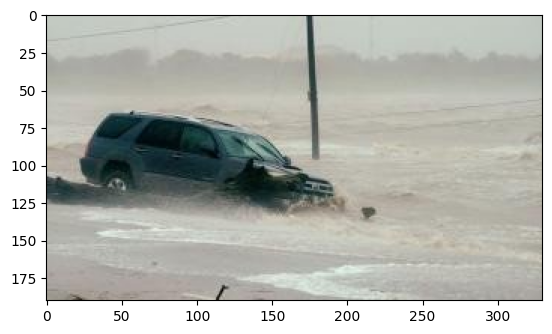

{'incident_probs': array([0.4187287 , 0.16869907, 0.10005979, 0.05064734, 0.0116625 ],
      dtype=float32),
 'incidents': ['storm surge',
               'dust sand storm',
               'tropical cyclone',
               'hailstorm',
               'heavy rainfall'],
 'place_probs': array([0.46883744, 0.35384595, 0.0587261 , 0.05312769, 0.03221573],
      dtype=float32),
 'places': ['beach', 'coast', 'ocean', 'desert', 'highway']}


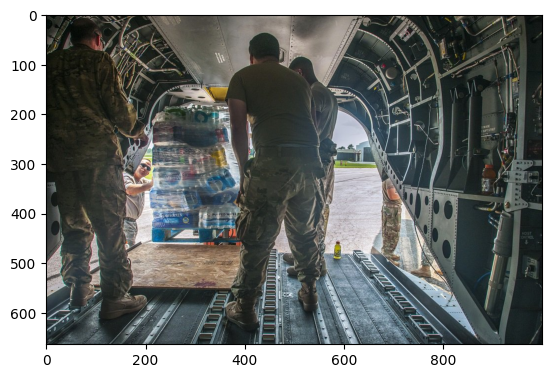

{'incident_probs': array([0.30440757, 0.02709348, 0.0131014 , 0.01188359, 0.01027331],
      dtype=float32),
 'incidents': ['under construction',
               'burned',
               'damaged',
               'snow covered',
               'collapsed'],
 'place_probs': array([0.34976327, 0.14247055, 0.11370932, 0.05668484, 0.01714804],
      dtype=float32),
 'places': ['construction site',
            'building outdoor',
            'street',
            'bridge',
            'religious building']}


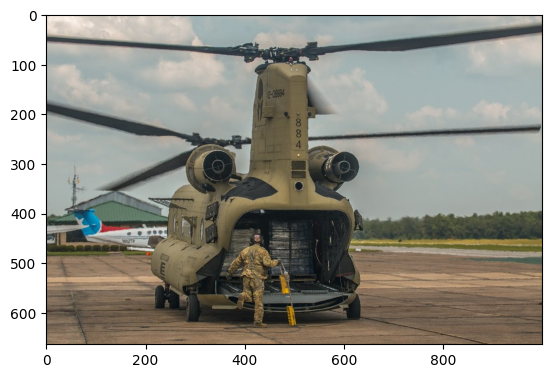

{'incident_probs': array([0.1581685 , 0.11259417, 0.04150843, 0.02746875, 0.01807601],
      dtype=float32),
 'incidents': ['under construction',
               'with smoke',
               'blocked',
               'airplane accident',
               'burned'],
 'place_probs': array([0.24253806, 0.17871802, 0.15101343, 0.09367231, 0.0676851 ],
      dtype=float32),
 'places': ['power line', 'sky', 'construction site', 'field', 'highway']}


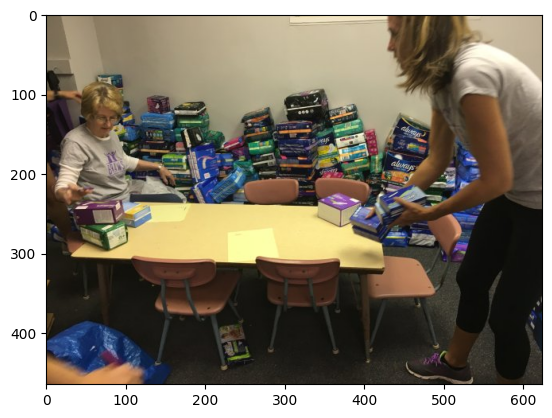

{'incident_probs': array([0.10179108, 0.02321261, 0.011563  , 0.00738145, 0.00720681],
      dtype=float32),
 'incidents': ['dirty contamined',
               'burned',
               'blocked',
               'with smoke',
               'damaged'],
 'place_probs': array([0.1369496 , 0.12600115, 0.02752599, 0.0213262 , 0.00808573],
      dtype=float32),
 'places': ['house', 'building outdoor', 'sports field', 'landfill', 'slum']}


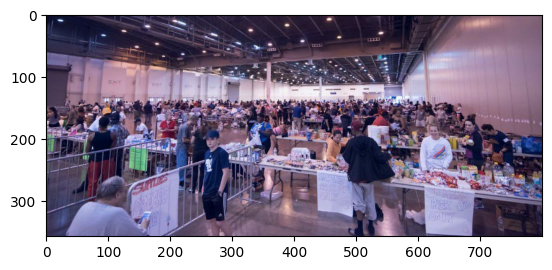

{'incident_probs': array([0.05940035, 0.01238598, 0.00816679, 0.00628157, 0.00226885],
      dtype=float32),
 'incidents': ['blocked', 'with smoke', 'snow covered', 'fog', 'damaged'],
 'place_probs': array([0.2879673 , 0.09304646, 0.03209255, 0.02754026, 0.00690599],
      dtype=float32),
 'places': ['religious building',
            'sports field',
            'bridge',
            'building outdoor',
            'building facade']}


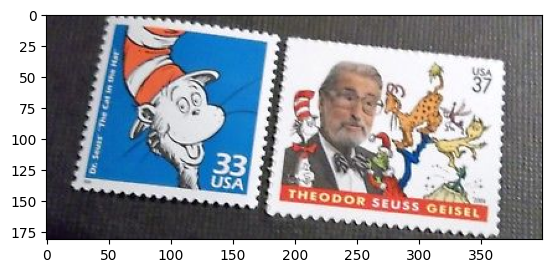

{'incident_probs': array([0.22679505, 0.04469293, 0.02529945, 0.01993553, 0.0155936 ],
      dtype=float32),
 'incidents': ['snow covered',
               'ice storm',
               'burned',
               'flooded',
               'snowslide avalanche'],
 'place_probs': array([0.4907313 , 0.15262437, 0.07039398, 0.01755301, 0.01456616],
      dtype=float32),
 'places': ['building outdoor',
            'snowfield',
            'building facade',
            'street',
            'religious building']}


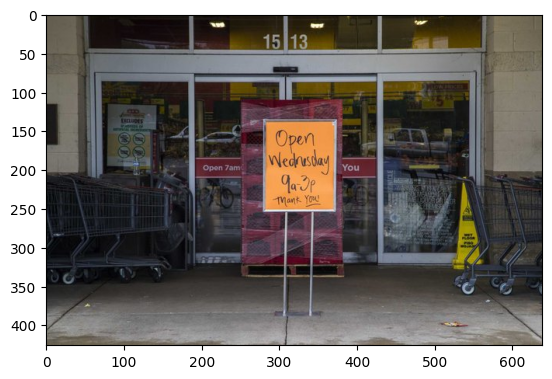

{'incident_probs': array([0.1106716 , 0.03844085, 0.03231891, 0.03205002, 0.01313573],
      dtype=float32),
 'incidents': ['under construction',
               'blocked',
               'car accident',
               'damaged',
               'traffic jam'],
 'place_probs': array([0.80698425, 0.19941586, 0.01597431, 0.0158775 , 0.01536283],
      dtype=float32),
 'places': ['gas station',
            'building outdoor',
            'parking lot',
            'building facade',
            'street']}


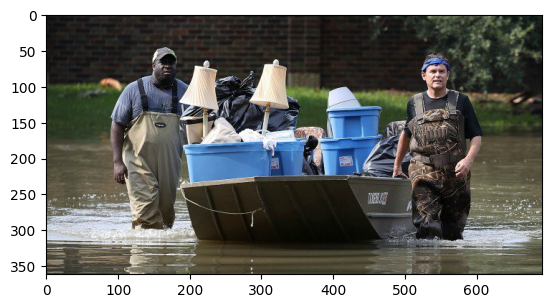

{'incident_probs': array([9.6228945e-01, 2.1448021e-03, 3.1517027e-04, 2.3257283e-04,
       9.9824218e-05], dtype=float32),
 'incidents': ['flooded',
               'heavy rainfall',
               'ship boat accident',
               'dirty contamined',
               'mudslide mudflow'],
 'place_probs': array([0.49445587, 0.13049534, 0.10061029, 0.0456103 , 0.02224186],
      dtype=float32),
 'places': ['river', 'building outdoor', 'lake natural', 'village', 'house']}


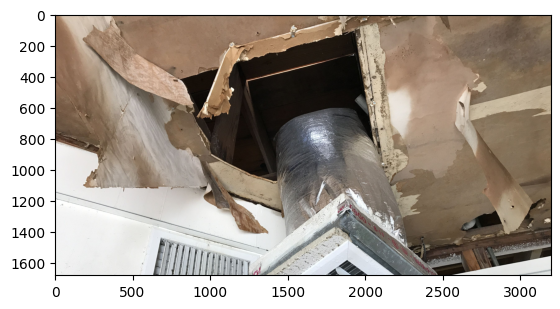

{'incident_probs': array([0.2018596 , 0.19959557, 0.1945359 , 0.07281912, 0.03591124],
      dtype=float32),
 'incidents': ['collapsed',
               'airplane accident',
               'earthquake',
               'damaged',
               'sinkhole'],
 'place_probs': array([0.28923917, 0.24219008, 0.0592098 , 0.02670704, 0.02352149],
      dtype=float32),
 'places': ['building outdoor',
            'house',
            'building facade',
            'gas station',
            'construction site']}


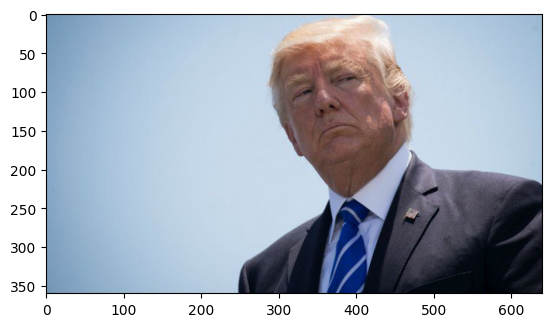

{'incident_probs': array([0.02875768, 0.02290571, 0.00602407, 0.00572306, 0.00563214],
      dtype=float32),
 'incidents': ['airplane accident',
               'with smoke',
               'burned',
               'drought',
               'snowslide avalanche'],
 'place_probs': array([0.05349421, 0.04433996, 0.03350458, 0.02569673, 0.02441   ],
      dtype=float32),
 'places': ['desert',
            'building outdoor',
            'sky',
            'religious building',
            'snowfield']}


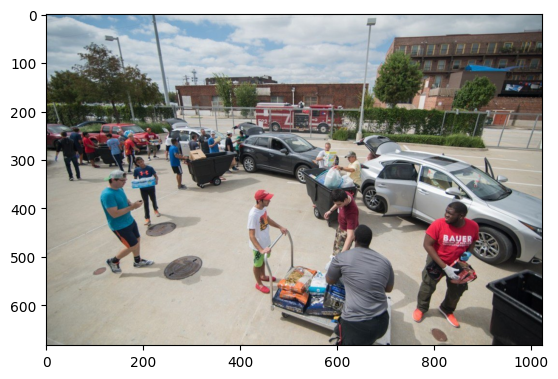

{'incident_probs': array([0.14382245, 0.0325548 , 0.00598356, 0.0053672 , 0.00486396],
      dtype=float32),
 'incidents': ['traffic jam',
               'blocked',
               'derecho',
               'sinkhole',
               'under construction'],
 'place_probs': array([0.49893796, 0.4967705 , 0.05446456, 0.03453878, 0.01676583],
      dtype=float32),
 'places': ['building outdoor', 'parking lot', 'street', 'downtown', 'highway']}


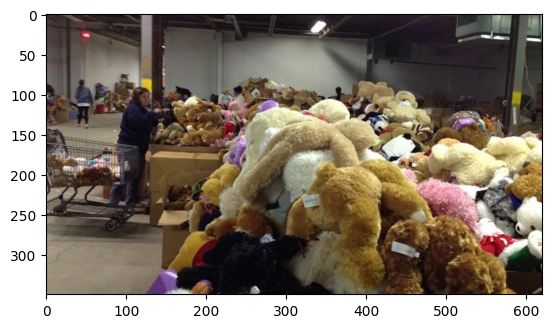

{'incident_probs': array([0.0906338 , 0.03180466, 0.01735741, 0.0149267 , 0.01434335],
      dtype=float32),
 'incidents': ['collapsed',
               'blocked',
               'dirty contamined',
               'traffic jam',
               'bicycle accident'],
 'place_probs': array([0.4444128 , 0.09899171, 0.03119309, 0.02388013, 0.02078792],
      dtype=float32),
 'places': ['building outdoor',
            'sports field',
            'religious building',
            'fire station',
            'building facade']}


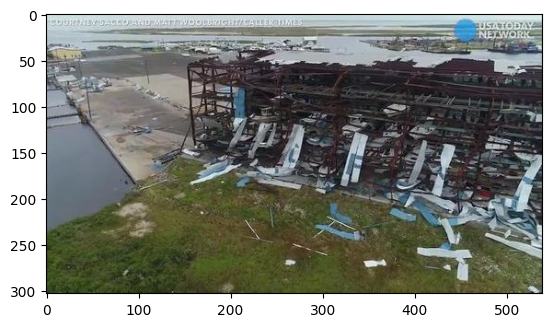

{'incident_probs': array([0.30127972, 0.12225387, 0.11570971, 0.10344711, 0.0508118 ],
      dtype=float32),
 'incidents': ['tropical cyclone',
               'damaged',
               'collapsed',
               'storm surge',
               'flooded'],
 'place_probs': array([0.2178866 , 0.05580632, 0.05139806, 0.04881432, 0.04806678],
      dtype=float32),
 'places': ['building outdoor',
            'residential neighborhood',
            'construction site',
            'industrial area',
            'house']}


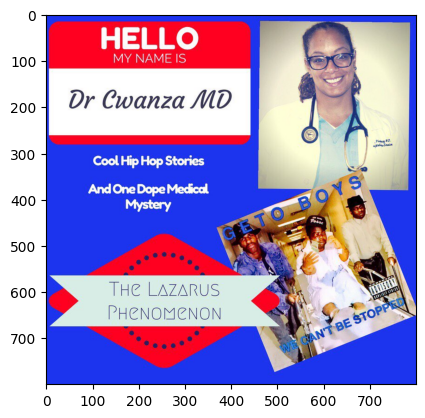

{'incident_probs': array([0.05029608, 0.0125407 , 0.01049263, 0.00901888, 0.00897314],
      dtype=float32),
 'incidents': ['on fire',
               'volcanic eruption',
               'with smoke',
               'thunderstorm',
               'airplane accident'],
 'place_probs': array([0.04398919, 0.03855715, 0.03543425, 0.02574859, 0.02459721],
      dtype=float32),
 'places': ['volcano',
            'fire station',
            'building outdoor',
            'nuclear power plant',
            'sports field']}


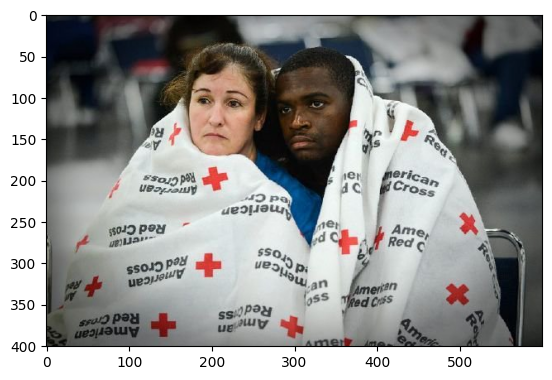

{'incident_probs': array([0.02716028, 0.01151394, 0.00858388, 0.00584354, 0.00559618],
      dtype=float32),
 'incidents': ['snow covered',
               'hailstorm',
               'with smoke',
               'on fire',
               'car accident'],
 'place_probs': array([0.5936485 , 0.02722497, 0.01299253, 0.01022779, 0.00700428],
      dtype=float32),
 'places': ['sports field',
            'highway',
            'snowfield',
            'street',
            'building outdoor']}


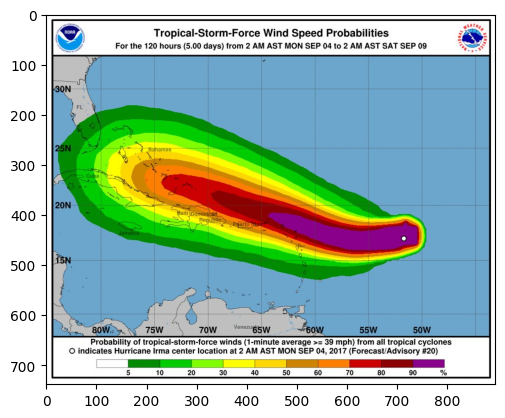

{'incident_probs': array([0.03390436, 0.02427405, 0.01134351, 0.00726151, 0.00655659],
      dtype=float32),
 'incidents': ['tropical cyclone',
               'storm surge',
               'mudslide mudflow',
               'under construction',
               'dirty contamined'],
 'place_probs': array([0.13557273, 0.05985969, 0.01750729, 0.0149457 , 0.01425029],
      dtype=float32),
 'places': ['building outdoor',
            'fire station',
            'industrial area',
            'nuclear power plant',
            'building facade']}


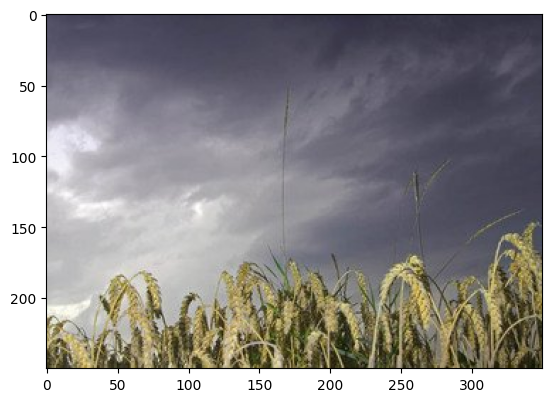

{'incident_probs': array([0.3687055 , 0.09926831, 0.03040459, 0.0159687 , 0.01377729],
      dtype=float32),
 'incidents': ['drought',
               'thunderstorm',
               'ice storm',
               'tropical cyclone',
               'dust sand storm'],
 'place_probs': array([0.7157657 , 0.08716752, 0.03691024, 0.03371877, 0.01213796],
      dtype=float32),
 'places': ['field', 'farm', 'desert', 'sky', 'desert road']}


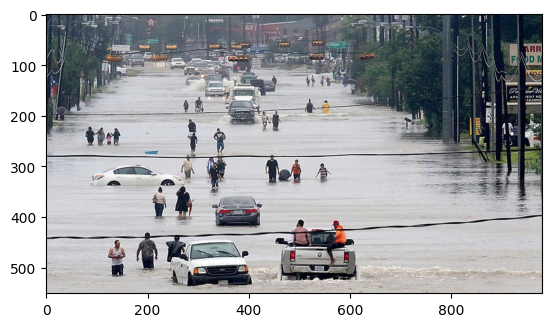

{'incident_probs': array([0.89093685, 0.06913943, 0.00861282, 0.00614988, 0.00093117],
      dtype=float32),
 'incidents': ['flooded',
               'heavy rainfall',
               'storm surge',
               'tropical cyclone',
               'mudslide mudflow'],
 'place_probs': array([0.43660656, 0.20394197, 0.17300591, 0.06401131, 0.00930884],
      dtype=float32),
 'places': ['street', 'building outdoor', 'downtown', 'highway', 'river']}


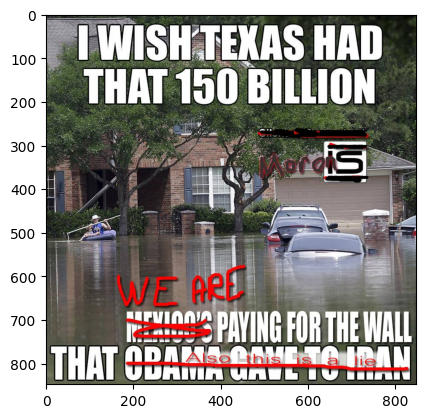

{'incident_probs': array([0.66941607, 0.00186731, 0.00162109, 0.00154386, 0.0012196 ],
      dtype=float32),
 'incidents': ['flooded',
               'mudslide mudflow',
               'heavy rainfall',
               'storm surge',
               'tropical cyclone'],
 'place_probs': array([0.20207378, 0.08088781, 0.06098054, 0.03591049, 0.02140438],
      dtype=float32),
 'places': ['building outdoor',
            'residential neighborhood',
            'house',
            'street',
            'downtown']}


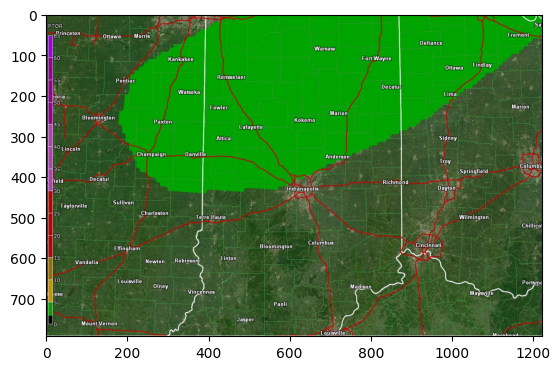

{'incident_probs': array([0.09503396, 0.04918177, 0.04423086, 0.02202337, 0.02142821],
      dtype=float32),
 'incidents': ['dust sand storm',
               'derecho',
               'tropical cyclone',
               'storm surge',
               'oil spill'],
 'place_probs': array([0.07132871, 0.06542768, 0.03512615, 0.02773014, 0.02702621],
      dtype=float32),
 'places': ['sky', 'highway', 'forest', 'lake natural', 'field']}


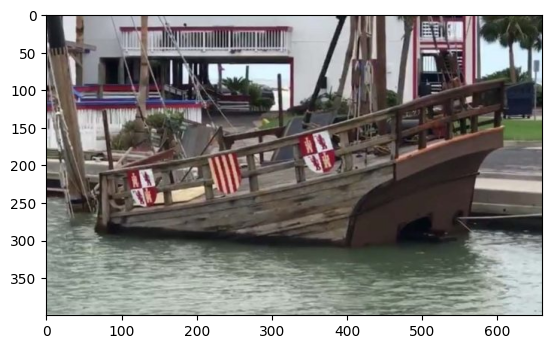

{'incident_probs': array([0.28199688, 0.02005451, 0.01928618, 0.01429496, 0.01010204],
      dtype=float32),
 'incidents': ['ship boat accident',
               'flooded',
               'collapsed',
               'damaged',
               'under construction'],
 'place_probs': array([0.2209386 , 0.1752857 , 0.13944441, 0.07540565, 0.04556699],
      dtype=float32),
 'places': ['port', 'river', 'bridge', 'building outdoor', 'pier']}


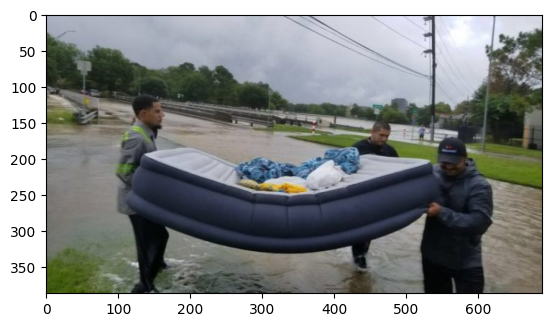

{'incident_probs': array([0.0826418 , 0.05272295, 0.00779602, 0.00551946, 0.00524078],
      dtype=float32),
 'incidents': ['flooded',
               'on fire',
               'blocked',
               'tropical cyclone',
               'dirty contamined'],
 'place_probs': array([0.24452369, 0.2412882 , 0.1269995 , 0.03675103, 0.02435206],
      dtype=float32),
 'places': ['railroad track', 'park', 'river', 'power line', 'farm']}


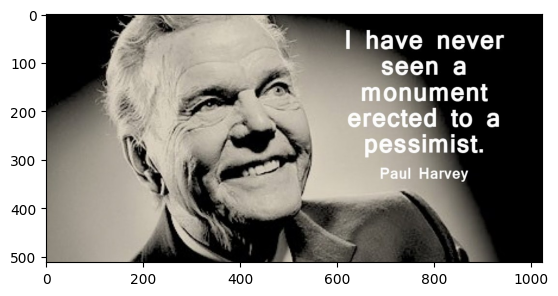

{'incident_probs': array([0.06159342, 0.04512274, 0.03562581, 0.01256961, 0.00895867],
      dtype=float32),
 'incidents': ['ice storm',
               'snow covered',
               'snowslide avalanche',
               'burned',
               'on fire'],
 'place_probs': array([0.12832381, 0.08354088, 0.02614355, 0.02120428, 0.01839704],
      dtype=float32),
 'places': ['snowfield',
            'lighthouse',
            'volcano',
            'building outdoor',
            'religious building']}


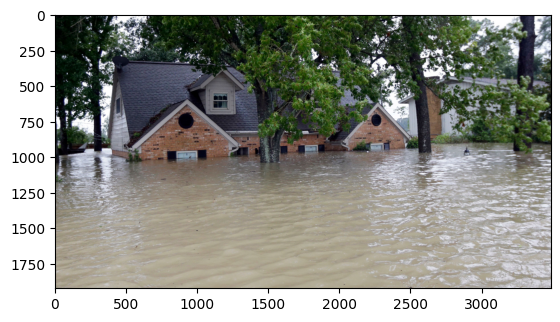

{'incident_probs': array([9.5646924e-01, 1.7530011e-02, 3.6904400e-03, 3.3795452e-03,
       3.6938692e-04], dtype=float32),
 'incidents': ['flooded',
               'tropical cyclone',
               'heavy rainfall',
               'storm surge',
               'mudslide mudflow'],
 'place_probs': array([0.2945955 , 0.12957792, 0.12215491, 0.11489984, 0.10895142],
      dtype=float32),
 'places': ['village', 'building outdoor', 'river', 'lake natural', 'house']}


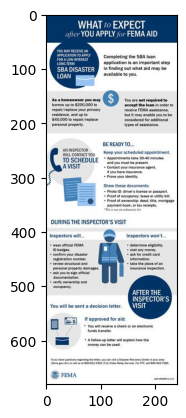

{'incident_probs': array([0.04841254, 0.03354882, 0.01897426, 0.00811675, 0.00724187],
      dtype=float32),
 'incidents': ['snow covered',
               'snowslide avalanche',
               'thunderstorm',
               'oil spill',
               'fire whirl'],
 'place_probs': array([0.12638244, 0.07690009, 0.05070554, 0.0424873 , 0.01444345],
      dtype=float32),
 'places': ['glacier', 'sports field', 'snowfield', 'mountain', 'fire station']}


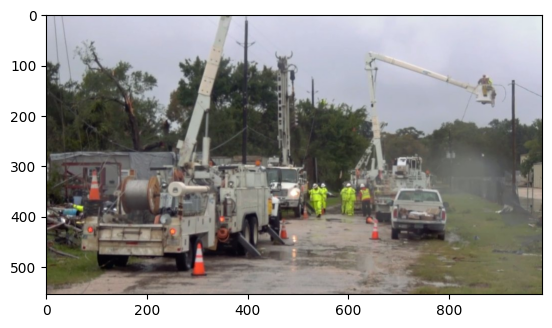

{'incident_probs': array([0.20888211, 0.19470942, 0.09631927, 0.05837307, 0.03349679],
      dtype=float32),
 'incidents': ['tropical cyclone',
               'heavy rainfall',
               'flooded',
               'mudslide mudflow',
               'blocked'],
 'place_probs': array([0.20376822, 0.20219271, 0.18189982, 0.09601019, 0.07101831],
      dtype=float32),
 'places': ['excavation',
            'highway',
            'construction site',
            'fire station',
            'power line']}


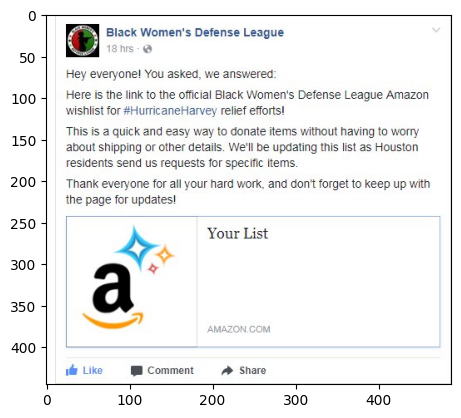

{'incident_probs': array([0.06231346, 0.03106518, 0.01650161, 0.01544209, 0.012742  ],
      dtype=float32),
 'incidents': ['fire whirl',
               'tornado',
               'on fire',
               'thunderstorm',
               'volcanic eruption'],
 'place_probs': array([0.12932211, 0.07626721, 0.06964432, 0.04664092, 0.03578101],
      dtype=float32),
 'places': ['railroad track',
            'fire station',
            'sports field',
            'volcano',
            'building outdoor']}


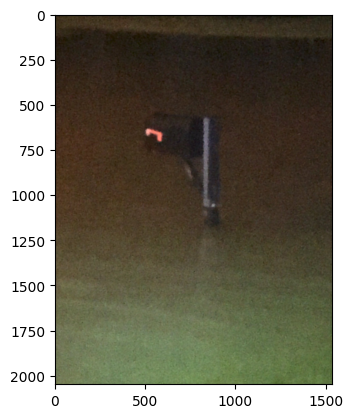

{'incident_probs': array([0.41300377, 0.14974228, 0.06920844, 0.03328317, 0.0231223 ],
      dtype=float32),
 'incidents': ['heavy rainfall',
               'flooded',
               'on fire',
               'fog',
               'motorcycle accident'],
 'place_probs': array([0.35384268, 0.0725195 , 0.06994677, 0.0650714 , 0.04361485],
      dtype=float32),
 'places': ['sports field',
            'street',
            'field',
            'building outdoor',
            'parking lot']}


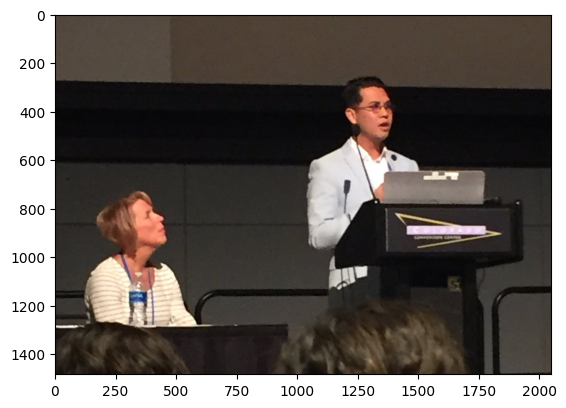

{'incident_probs': array([0.02966398, 0.02629526, 0.02443344, 0.01897371, 0.01764842],
      dtype=float32),
 'incidents': ['on fire',
               'tornado',
               'fire whirl',
               'car accident',
               'motorcycle accident'],
 'place_probs': array([0.1508725 , 0.05514083, 0.05439886, 0.03284355, 0.01434035],
      dtype=float32),
 'places': ['building outdoor', 'house', 'gas station', 'highway', 'farm']}


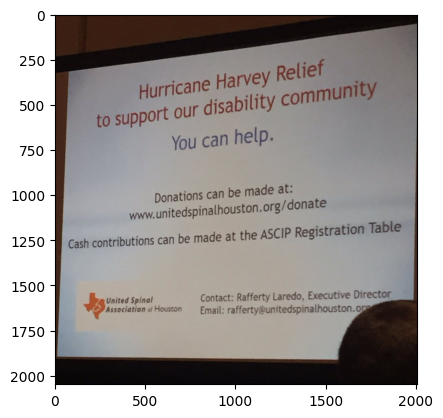

{'incident_probs': array([0.04040842, 0.03410283, 0.01478437, 0.01406193, 0.01226485],
      dtype=float32),
 'incidents': ['fog',
               'oil spill',
               'on fire',
               'ship boat accident',
               'dirty contamined'],
 'place_probs': array([0.15730937, 0.12654847, 0.07476907, 0.04644494, 0.03590984],
      dtype=float32),
 'places': ['ocean', 'port', 'coast', 'beach', 'lake natural']}


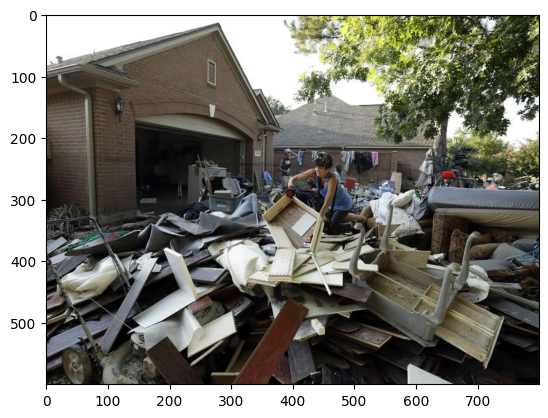

{'incident_probs': array([0.78276885, 0.06461082, 0.02817328, 0.02296871, 0.00937504],
      dtype=float32),
 'incidents': ['earthquake',
               'airplane accident',
               'damaged',
               'collapsed',
               'car accident'],
 'place_probs': array([0.6148233 , 0.06877775, 0.05724542, 0.05365717, 0.024676  ],
      dtype=float32),
 'places': ['building outdoor',
            'house',
            'junkyard',
            'landfill',
            'residential neighborhood']}


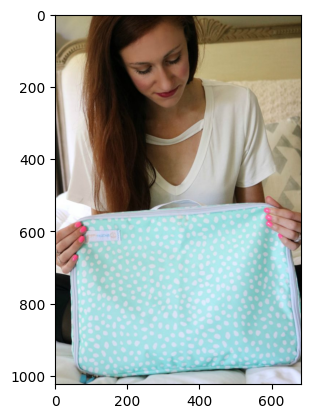

{'incident_probs': array([0.10139709, 0.06032512, 0.03429893, 0.0220407 , 0.01507462],
      dtype=float32),
 'incidents': ['burned',
               'car accident',
               'on fire',
               'airplane accident',
               'with smoke'],
 'place_probs': array([0.06867988, 0.05511949, 0.04484904, 0.02676445, 0.02583866],
      dtype=float32),
 'places': ['building outdoor', 'house', 'gas station', 'highway', 'street']}


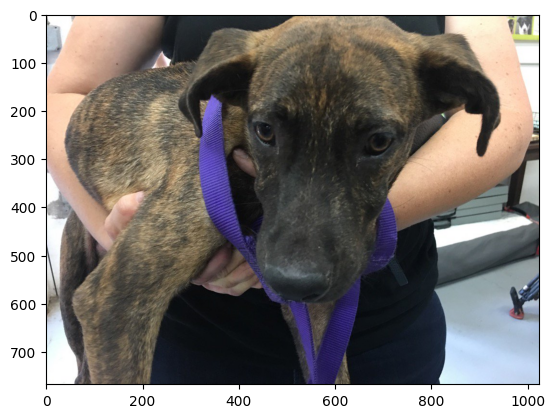

{'incident_probs': array([0.09083761, 0.0899768 , 0.05577905, 0.04391161, 0.03343492],
      dtype=float32),
 'incidents': ['with smoke', 'burned', 'snow covered', 'drought', 'hailstorm'],
 'place_probs': array([0.135529  , 0.07695641, 0.0598096 , 0.05844957, 0.01854129],
      dtype=float32),
 'places': ['beach', 'building outdoor', 'desert', 'park', 'snowfield']}


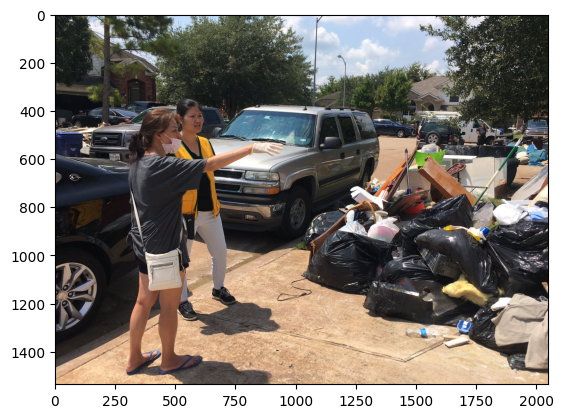

{'incident_probs': array([0.26460183, 0.14677352, 0.04309642, 0.00868234, 0.00623295],
      dtype=float32),
 'incidents': ['motorcycle accident',
               'traffic jam',
               'car accident',
               'bicycle accident',
               'blocked'],
 'place_probs': array([0.31342953, 0.18843699, 0.10329549, 0.07454433, 0.04092503],
      dtype=float32),
 'places': ['parking lot', 'street', 'building outdoor', 'highway', 'junkyard']}


In [ ]:
for image_filename in list(inference_dict.keys())[1000:1010]:
    img = cv2.imread(image_filename)[:,:,::-1].copy() 
    plt.imshow(img)
    plt.show()
    pprint.pprint(inference_dict[image_filename])

In [ ]:
with open('crisismmd_inference_dict.json', 'r') as fp:
  d = json.load(fp)